# Wine Quality Prediction (DSCI522_group17)

## Exploratory Data Analysis

In [1]:
# uploading libraries
import pandas as pd
import numpy as np
from pandas_profiling import ProfileReport
import seaborn as sns
import altair as alt
import warnings
import matplotlib.pyplot as plt
warnings.filterwarnings('ignore')

# Introduction

The data set used in this project is sourced from the UCI Machine Learning Repository. There are two datasets. One is for red wine while the other is for white wine. We will merge these two datasets together and create a new column type of wine to represent the wine type for each observation. In addition, we will group the quality of wine into three categories and they are "Bad", "Good", and "Excellent". In total, we have 12 predictors and one output variable.

In [2]:
#Uploading dataset for redwine
data_red= pd.read_csv("../data/raw/winequality-red.csv", ";")

In [3]:
#cleaning data
data_red = data_red.rename(columns=lambda x: x.replace(" ","_"))

#creating levels for 'quality_level' column
data_red['quality_level'] = ["Excellent" if x >= 7 else "Good" if x >= 5 else "Bad" for x in data_red['quality']]
data_red['wine_type']= "red"
#data_red.head()

In [4]:
#load data
data_red.sample(3)

,fixed_acidity,volatile_acidity,citric_acid,residual_sugar,chlorides,free_sulfur_dioxide,total_sulfur_dioxide,density,pH,sulphates,alcohol,quality,quality_level,wine_type
1537,5.4,0.58,0.08,1.9,0.059,20.0,31.0,0.99484,3.50,0.64,10.2,6,Good,red
507,11.2,0.67,0.55,2.3,0.084,6.0,13.0,1.00000,3.17,0.71,9.5,6,Good,red
1304,7.6,0.79,0.21,2.3,0.087,21.0,68.0,0.99550,3.12,0.44,9.2,5,Good,red


In [5]:
#uploading white wine data set
data_white= pd.read_csv("../data/raw/winequality-white.csv", ";")

In [6]:
#cleaning data
data_white = data_white.rename(columns=lambda x: x.replace(" ","_"))

#creating levels for 'quality_level' column
data_white['quality_level'] = ["Excellent" if x >= 7 else "Good" if x >= 5 else "Bad" for x in data_white['quality']]
data_white['wine_type']= "white"

In [7]:
#dimension red wine data set
data_red.shape

(1599, 14)

In [8]:
#dimension white wine data set
data_white.shape

(4898, 14)

In [9]:
#merging red wine and white wine data set
full_data = pd.concat([data_white, data_red], axis=0)
full_data = full_data.drop('quality', axis = 1)

In [10]:
#dimension of merged data set
full_data.shape

(6497, 13)

In [11]:
#first 4 lines of data set
full_data.head(5)

,fixed_acidity,volatile_acidity,citric_acid,residual_sugar,chlorides,free_sulfur_dioxide,total_sulfur_dioxide,density,pH,sulphates,alcohol,quality_level,wine_type
0,7.0,0.27,0.36,20.7,0.045,45.0,170.0,1.0010,3.00,0.45,8.8,Good,white
1,6.3,0.30,0.34,1.6,0.049,14.0,132.0,0.9940,3.30,0.49,9.5,Good,white
2,8.1,0.28,0.40,6.9,0.050,30.0,97.0,0.9951,3.26,0.44,10.1,Good,white
3,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.9956,3.19,0.40,9.9,Good,white
4,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.9956,3.19,0.40,9.9,Good,white


# Spliting the data set into training and test sets

**Before starting our analysis, we will split the data into train data set (75%) and into training (25%) data set. Below is the distribution  of each class in the training set.**

In [12]:
#split
from sklearn.model_selection import train_test_split
train_df, test_df = train_test_split(full_data, test_size=0.25, random_state=123)
dist_class = alt.Chart(train_df, title = 'Distribution of Quality Level').mark_bar().encode(x = alt.X('quality_level', title = 'Quality Level'),
                                      y = 'count()').properties(width=200, height = 200)
dist_class.save('figures/dist_class.html')
dist_class

alt.Chart(...)

# Exploratory data analysis (EDA) by using pandas profile Python module and Seaborn Python library

Here, we will use Pandas Profiling to do a basic analysis on each of the variable.

In [13]:
profile = ProfileReport(train_df)

In [14]:
profile

In [15]:
profile.to_file(output_file="figures/Pandas_profiling.html")

### Boxplot to Analyze Distributions as well as Outliers for Each Continous Predictors(double click to enlarge)

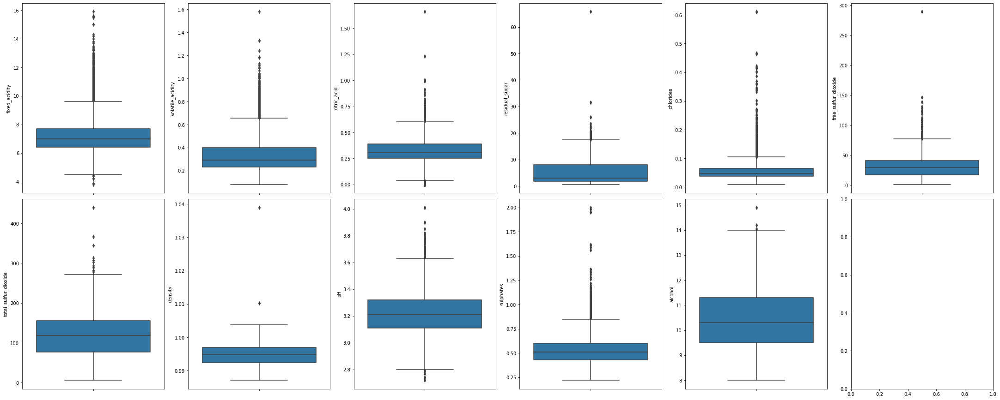

In [16]:
fig, ax = plt.subplots(ncols=6, nrows=2, figsize=(30,12))
index=0
ax= ax.flatten()
for col, value in train_df.drop(['quality_level', 'wine_type'], axis = 1).items():
    sns.boxplot(y=col, data=full_data , ax=ax[index])
    index +=1
plt.tight_layout(pad=0.5, w_pad=0.7)

### Density plot to Analyze Data Distribution

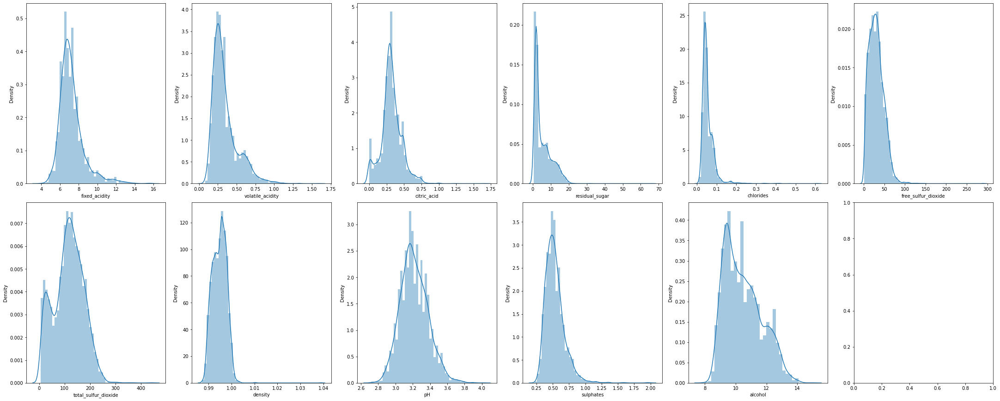

In [17]:
import matplotlib.pyplot as plt
fig, ax = plt.subplots(ncols=6, nrows=2, figsize=(30,12))
index=0
ax= ax.flatten()

for col, value in train_df.drop(['quality_level', 'wine_type'], axis = 1).items():
    sns.distplot(value, ax=ax[index])
    index +=1

plt.savefig('figures/Distribution.png')
plt.tight_layout(pad=0.5, w_pad=0.7)


### Seaborn Pairplot to Analyze the Interaction Between Variables Among Each Class (double click to enlarge the file)

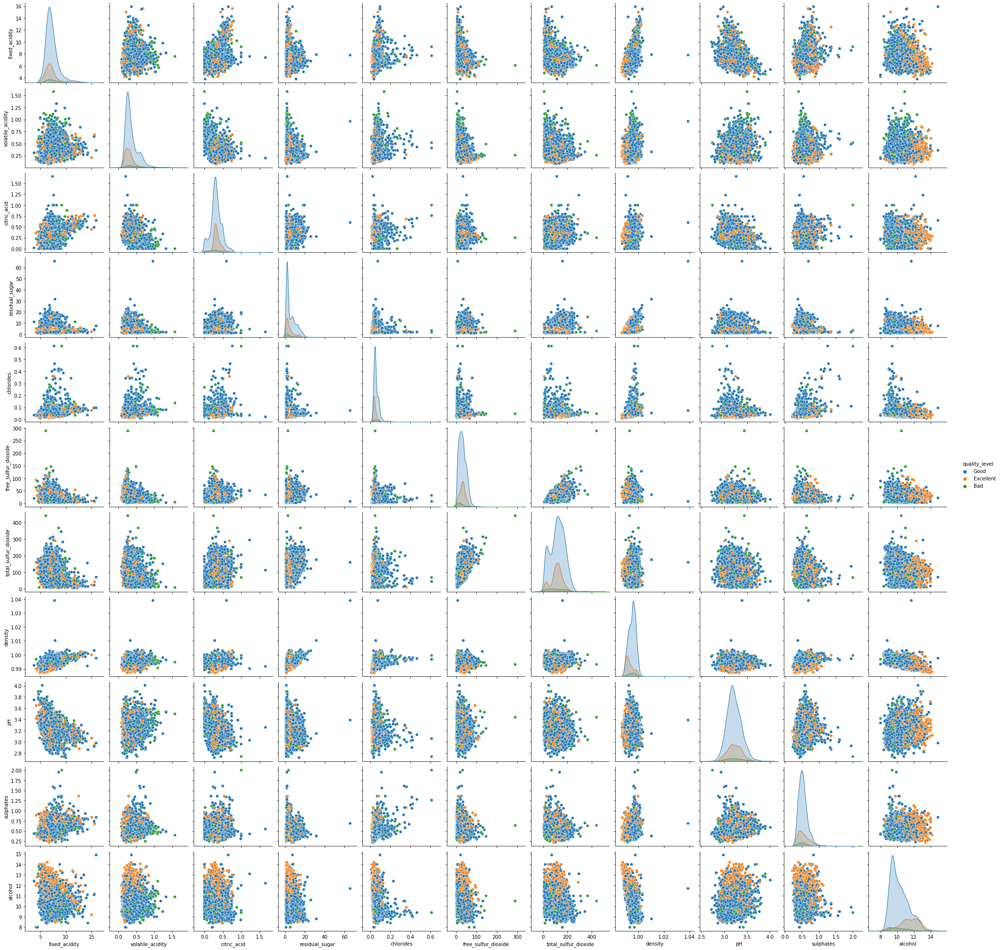

In [18]:
wine_pairplot = sns.pairplot(train_df.drop('wine_type', axis = 1), hue="quality_level")
wine_pairplot.savefig("figures/wine_pairplot.png")
wine_pairplot

# Observations

- There are no missing values in the training data set.
- Some of the variables such as fixed_acidity, volatile_acidity etc. are very right skewed and may need a treatment. We may need to scale the data when building our model.
- Most of the continous variables contain outliers. However, some variables(citric acid, residual_sugar, free_sulfur_dioxide, density etc ) contain bigger outliers. Hence, we may need to treat them before building our models.